In [22]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler #to normalize the data

from scipy import stats

# plotting modules
import seaborn as sns # When we have large amount of data seaborn will help us to visualize the data and style it
import matplotlib.pyplot as plt
from bokeh.plotting import figure, output_file, show

#import geoplot as gplt
import geopandas as gpd
#import geoplot.crs as gcrs
import imageio
import pathlib

#import mapclassify as mc
import plotly.express as px

import folium
from folium.plugins import MarkerCluster

In [23]:
sales = pd.read_excel("/content/SalesDataset2020.xlsx")
sales

,Date,Time,State,Group,Unit,Sales
0,2020-10-01,Morning,WA,Kids,8,20000
1,2020-10-01,Morning,WA,Men,8,20000
2,2020-10-01,Morning,WA,Women,4,10000
3,2020-10-01,Morning,WA,Seniors,15,37500
4,2020-10-01,Afternoon,WA,Kids,3,7500
...,...,...,...,...,...,...
7555,2020-12-30,Afternoon,TAS,Seniors,14,35000
7556,2020-12-30,Evening,TAS,Kids,15,37500
7557,2020-12-30,Evening,TAS,Men,15,37500
7558,2020-12-30,Evening,TAS,Women,11,27500


●	Ensure that the data is clean and that there is no missing or incorrect data.

In [ ]:
sales.isna()

,Date,Time,State,Group,Unit,Sales
0,False,False,False,False,False,False
1,False,False,False,False,False,False
2,False,False,False,False,False,False
3,False,False,False,False,False,False
4,False,False,False,False,False,False
...,...,...,...,...,...,...
7555,False,False,False,False,False,False
7556,False,False,False,False,False,False
7557,False,False,False,False,False,False
7558,False,False,False,False,False,False


In [24]:
sales['Date'] = pd.to_datetime(sales['Date'])
sales['Time'] = sales['Time'].astype('category')
sales['State'] = sales['State'].astype('category')
sales['Group'] = sales['Group'].astype('category')
sales.dtypes

Date     datetime64[ns]
Time           category
State          category
Group          category
Unit              int64
Sales             int64
dtype: object

●	Select an appropriate Data Wrangling approach —  data standardization or data normalization. Perform the standardization or normalization and present the data. (Normalization is the preferred approach for this problem.)

In [ ]:
#Exclude non-numeric columns from normalization
numeric_columns = sales.select_dtypes(include=['int', 'float']).columns
numeric_data = sales[numeric_columns]

#Normalize the numeric columns
scaler = MinMaxScaler()
normalized_data = pd.DataFrame(scaler.fit_transform(numeric_data), columns=numeric_data.columns)

#Combine the normalized numeric columns with the non-numeric columns
normalized_data = pd.concat([normalized_data, sales.drop(columns=numeric_columns)], axis=1)

#Print the normalized DataFrame
print(normalized_data)

          Unit     Sales       Date        Time State     Group
0     0.095238  0.095238 2020-10-01     Morning    WA      Kids
1     0.095238  0.095238 2020-10-01     Morning    WA       Men
2     0.031746  0.031746 2020-10-01     Morning    WA     Women
3     0.206349  0.206349 2020-10-01     Morning    WA   Seniors
4     0.015873  0.015873 2020-10-01   Afternoon    WA      Kids
...        ...       ...        ...         ...   ...       ...
7555  0.190476  0.190476 2020-12-30   Afternoon   TAS   Seniors
7556  0.206349  0.206349 2020-12-30     Evening   TAS      Kids
7557  0.206349  0.206349 2020-12-30     Evening   TAS       Men
7558  0.142857  0.142857 2020-12-30     Evening   TAS     Women
7559  0.174603  0.174603 2020-12-30     Evening   TAS   Seniors

[7560 rows x 6 columns]


●	Share your recommendation on the usage of the groupby() function for data chunking or merging.

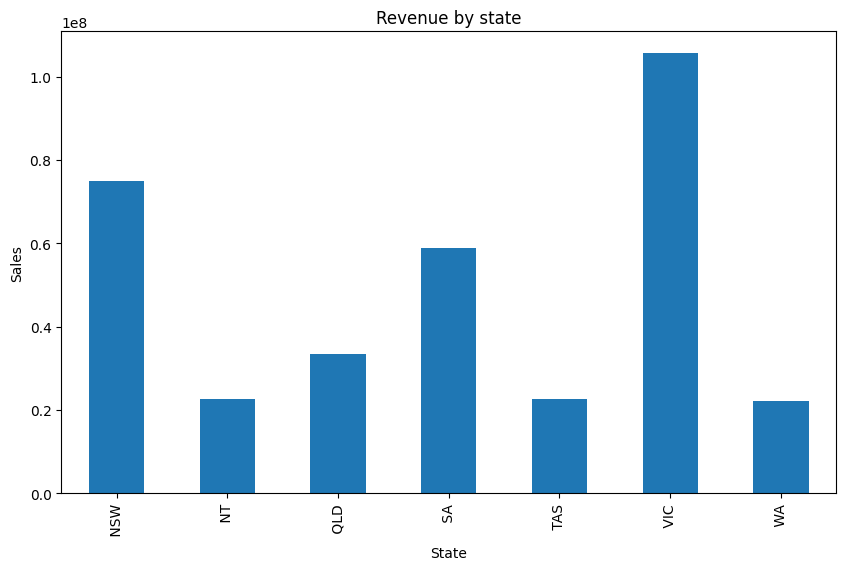

In [ ]:
sales.groupby('State').State.count()
# groupby state and display the revenue(sales) of each state
state_revenue = sales.groupby('State').Sales.sum()
highest_state_revenue = state_revenue.sort_values(ascending=False)
highest_state_revenue

# plot the revenue of each state
state_revenue.plot(kind = 'bar', figsize = (10,6))
plt.xlabel('State')
plt.ylabel('Sales')
plt.title('Revenue by state')
plt.show()

●	Perform descriptive statistical analysis on the data (Sales and Unit columns) (Techniques such as mean, median, mode and standard deviation can be used.).

In [ ]:
# Average sales for each state
median_sales_state = sales.groupby('State')['Sales'].median().rename('Average sales for each state')
print('\n Average sales for each state: \n ')
print(median_sales_state)

# Average sales across all states
median_sales = sales.Sales.median()
print('\n Average sales across all states: \n')
print(median_sales)

# Groupby 'Group' and 'State' columns then compare the total sales of each group
sales_group_sum = sales.groupby(['State', 'Group']).Sales.max()
print('\n Total sales for each group: \n')
print(sales_group_sum)

# Groupby 'State' and 'Time' columns then compare the total unit which is the goods of each group
# In other words : compare the total goods for each state and time
total_goods = sales.groupby(['State', 'Time']).Unit.sum()
print('\n Total goods for each state and time: \n')
print(total_goods)

# Calculate descriptive statistics for "Sales" and "Unit" columns
sales_stats = sales['Sales'].describe()
unit_stats = sales['Unit'].describe()

# Calculate mode for "Sales" and "Unit" columns
sales_mode = sales['Sales'].mode()
unit_mode = sales['Unit'].mode()


# Print the statistics
print("\n Sales Statistics: \n")
print(sales_stats)

print("\n Unit Statistics: \n")
print(unit_stats)

print("\n Sales Mode: \n")
print(sales_mode)

print("\n Unit Mode: \n")
print(unit_mode)


 Average sales for each state: 
 
State
 NSW    70000.0
 NT     20000.0
 QLD    30000.0
 SA     52500.0
 TAS    20000.0
 VIC    95000.0
 WA     20000.0
Name: Average sales for each state, dtype: float64

 Average sales across all states: 

35000.0

 Total sales for each group: 

State  Group   
 NSW    Kids       112500
        Men        112500
        Seniors    112500
        Women      112500
 NT     Kids        37500
        Men         37500
        Seniors     37500
        Women       37500
 QLD    Kids        62500
        Men         62500
        Seniors     62500
        Women       62500
 SA     Kids        87500
        Men         87500
        Seniors     87500
        Women       87500
 TAS    Kids        37500
        Men         37500
        Seniors     37500
        Women       37500
 VIC    Kids       162500
        Men        160000
        Seniors    162500
        Women      162500
 WA     Kids        37500
        Men         37500
        Seniors     37500
 

●	Determine which group is generating the highest sales, and which group is generating the lowest sales.

In [ ]:
group_sales = sales.groupby('Group')['Sales'].sum()

max_sales_group = group_sales.idxmax()
min_sales_group = group_sales.idxmin()
print("Highest sales:", max_sales_group)
print("Lowest sales:", min_sales_group)

Highest sales:  Men
Lowest sales:  Seniors


●	Determine which state is generating the highest sales, and which state is generating the lowest sales.

In [ ]:
state_sales = sales.groupby('State')['Sales'].sum()

max_sales_state = state_sales.idxmax()
min_sales_state = state_sales.idxmin()
print("Highest sales:", max_sales_state)
print("Lowest sales:", min_sales_state)

Highest sales:  VIC
Lowest sales:  WA


●	Generate weekly, monthly and quarterly reports for the analysis made.

In [ ]:
sales.set_index('Date', inplace=True)

# Generate weekly report
weekly_report = sales['Sales'].resample('W').sum().rename('Weekly Sales')

weekly_report_MAX_MIN = pd.DataFrame({'Max Sales': [sales['Sales'].resample('W').sum().max()],
                              'Min Sales': [sales['Sales'].resample('W').sum().min()]})


#Generate monthly report
monthly_report = sales['Sales'].resample('M').sum()

#Generate quarterly report
quarterly_report = sales['Sales'].resample('Q').sum()

print("Weekly Report: \n")
print(weekly_report)
print("\n Weekly Report Max-Min: \n")
print(weekly_report_MAX_MIN)
print("\n Monthly Report: \n")
print(monthly_report)
print("\n Quarterly Report: \n")
print(quarterly_report)


Weekly Report: 

Date
2020-10-04    15045000
2020-10-11    27002500
2020-10-18    26640000
2020-10-25    26815000
2020-11-01    21807500
2020-11-08    20865000
2020-11-15    21172500
2020-11-22    21112500
2020-11-29    21477500
2020-12-06    29622500
2020-12-13    31525000
2020-12-20    31655000
2020-12-27    31770000
2021-01-03    13792500
Freq: W-SUN, Name: Weekly Sales, dtype: int64

 Weekly Report Max-Min: 

   Max Sales  Min Sales
0   31770000   13792500

 Monthly Report: 

Date
2020-10-31    114290000
2020-11-30     90682500
2020-12-31    135330000
Freq: M, Name: Sales, dtype: int64

 Quarterly Report: 

Date
2020-12-31    340302500
Freq: Q-DEC, Name: Sales, dtype: int64


•	State-wise sales analysis for different groups (kids, women, men, and seniors)

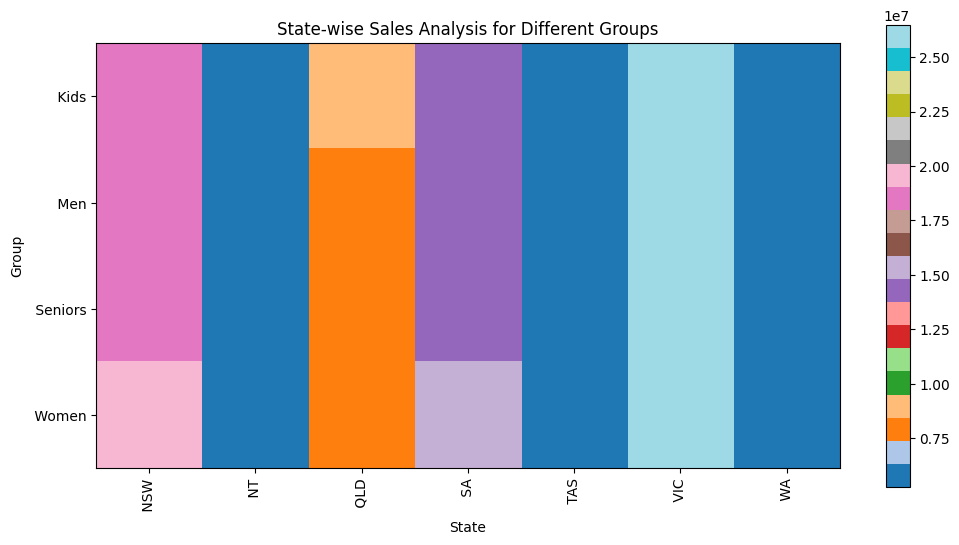

In [ ]:
start_date = pd.to_datetime('2020-10-01')
end_date = pd.to_datetime('2020-12-30')

sales_filtered = sales[(sales['Date'] >= start_date) & (sales['Date'] <= end_date)]

state_group_sales = sales_filtered.groupby(['Group', 'State'])['Sales'].sum().unstack()

plt.figure(figsize=(12, 6))
plt.imshow(state_group_sales, cmap='tab20')
plt.colorbar()
plt.xlabel('State')
plt.ylabel('Group')
plt.title('State-wise Sales Analysis for Different Groups')
plt.xticks(range(len(state_group_sales.columns)), state_group_sales.columns, rotation=90)
plt.yticks(range(len(state_group_sales.index)), state_group_sales.index)

plt.show()



•	Group-wise sales analysis (kids, women, men, and seniors) across different states.

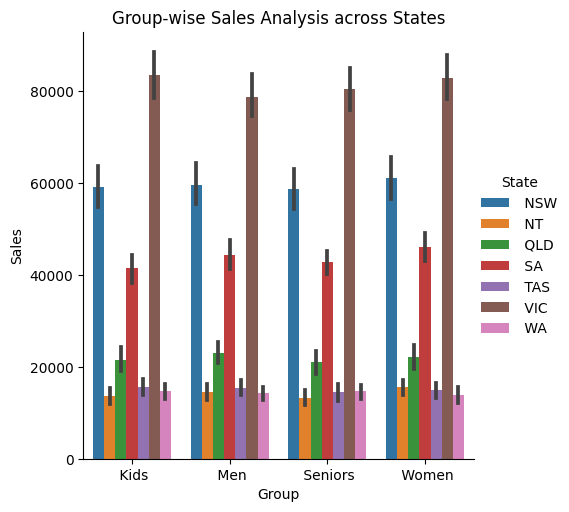

In [ ]:
start_date = pd.to_datetime('2020-11-01')
end_date = pd.to_datetime('2020-11-19')

sales_filtered = sales[(sales['Date'] >= start_date) & (sales['Date'] <= end_date)]

#state_group_sales = sales_filtered.groupby(['State', 'Group'])['Sales'].sum().unstack()

sns.catplot(x='Group', y='Sales', hue='State', data=sales_filtered, kind='bar')
plt.title('Group-wise Sales Analysis across States')
plt.xlabel('Group')
plt.ylabel('Sales')
plt.show()

•	Time-of-the-day analysis: during which time of the day are sales the highest, and during which time are sales the lowest? [This helps S&M teams design programs for increasing sales such as hyper-personalization and Next Best Offers].

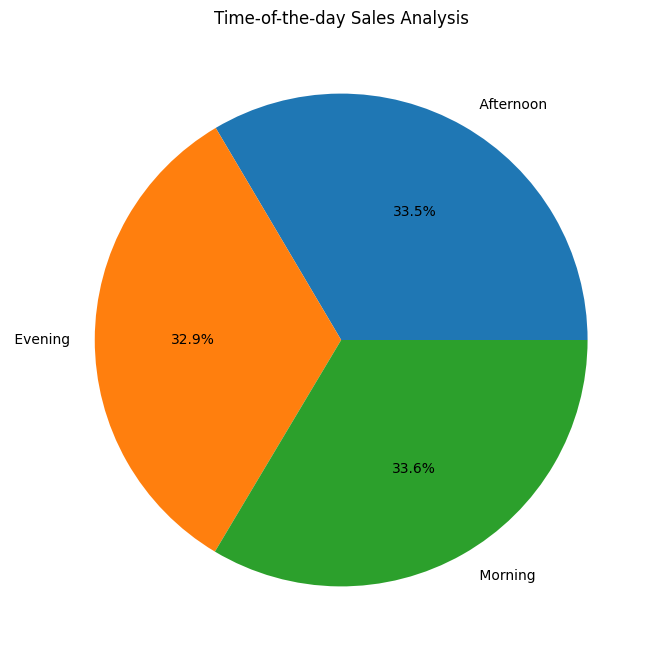

In [ ]:
time_group_sales = sales.groupby('Time')['Sales'].sum()

plt.figure(figsize=(8, 8))
plt.pie(time_group_sales, labels=time_group_sales.index, autopct='%1.1f%%')
plt.title('Time-of-the-day Sales Analysis')
plt.show()


The daily, weekly, and monthly sales

<ipython-input-4-2015b02f3b3b>:3: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated. Please use Series.dt.isocalendar().week instead.
  sales['Week'] = sales['Date'].dt.week


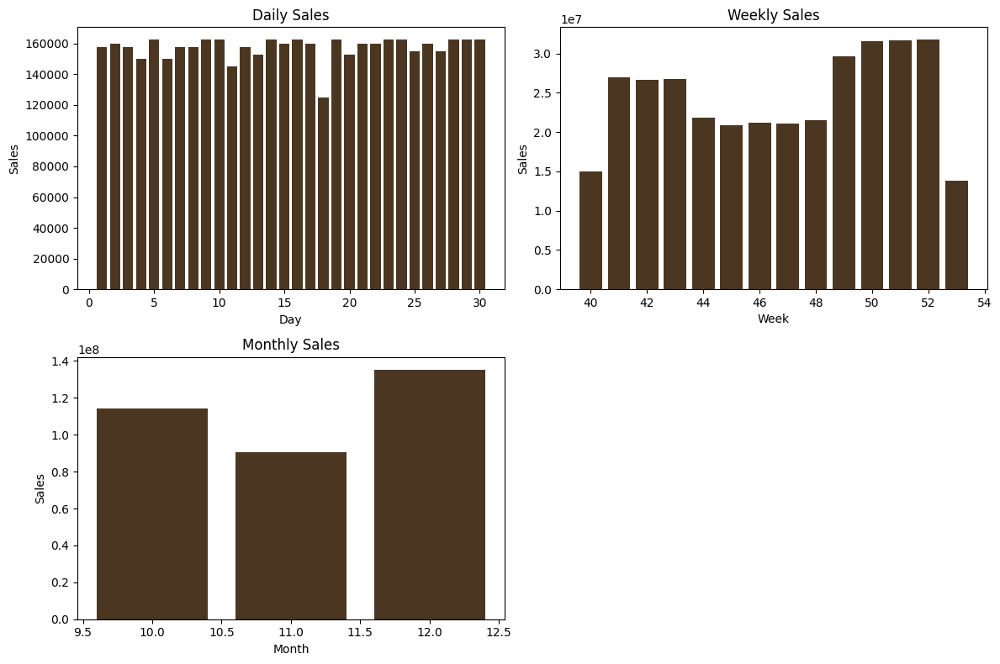

In [ ]:
#day, week, and month from column Date:
sales['Day'] = sales['Date'].dt.day
sales['Week'] = sales['Date'].dt.week
sales['Month'] = sales['Date'].dt.month

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 8))

# Daily Sales
axes[0, 0].bar(sales['Day'], sales['Sales'], color='#4b3621')
axes[0, 0].set_xlabel('Day')
axes[0, 0].set_ylabel('Sales')
axes[0, 0].set_title('Daily Sales')

# Weekly Sales
weekly_sales = sales.groupby('Week')['Sales'].sum()
axes[0, 1].bar(weekly_sales.index, weekly_sales.values, color='#4b3621')
axes[0, 1].set_xlabel('Week')
axes[0, 1].set_ylabel('Sales')
axes[0, 1].set_title('Weekly Sales')

# Monthly Sales
monthly_sales = sales.groupby('Month')['Sales'].sum()
axes[1, 0].bar(monthly_sales.index, monthly_sales.values, color='#4b3621')
axes[1, 0].set_xlabel('Month')
axes[1, 0].set_ylabel('Sales')
axes[1, 0].set_title('Monthly Sales')

# Remove empty subplot
fig.delaxes(axes[1, 1])

# Adjust spacing between subplots
plt.tight_layout()

# Show the dashboard
plt.show()

In [ ]:
!pip install --upgrade geopandas

In [ ]:
!pip install --upgrade geoplot

In [ ]:
!pip install --upgrade pysal

In [21]:
!pip install folium

Sales in each state in geographic plot


In [26]:
#adding coordinates for each state
coordinates = {' WA': ('-33.58287392', '120.0333345'), ' NT': ('-13.81617348', '131.816698'),
               ' SA': ('-34.28293455', '140.6000378'), ' VIC': ('-37.73119953', '142.0234135'),
               ' QLD': ('-26.67998777', '153.0500272'), ' NSW': ('-33.42004148', '151.3000048'),
               ' TAS': ('-40.83292234', '145.1166613')}

sales['Latitude'] = sales['State'].map(lambda x: coordinates[x][0])
sales['Longitude'] = sales['State'].map(lambda x: coordinates[x][1])

sales

,Date,Time,State,Group,Unit,Sales,Latitude,Longitude
0,2020-10-01,Morning,WA,Kids,8,20000,-33.58287392,120.0333345
1,2020-10-01,Morning,WA,Men,8,20000,-33.58287392,120.0333345
2,2020-10-01,Morning,WA,Women,4,10000,-33.58287392,120.0333345
3,2020-10-01,Morning,WA,Seniors,15,37500,-33.58287392,120.0333345
4,2020-10-01,Afternoon,WA,Kids,3,7500,-33.58287392,120.0333345
...,...,...,...,...,...,...,...,...
7555,2020-12-30,Afternoon,TAS,Seniors,14,35000,-40.83292234,145.1166613
7556,2020-12-30,Evening,TAS,Kids,15,37500,-40.83292234,145.1166613
7557,2020-12-30,Evening,TAS,Men,15,37500,-40.83292234,145.1166613
7558,2020-12-30,Evening,TAS,Women,11,27500,-40.83292234,145.1166613


<ipython-input-30-6edd9d238c9d>:10: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  gpd.datasets.get_path("naturalearth_lowres"))


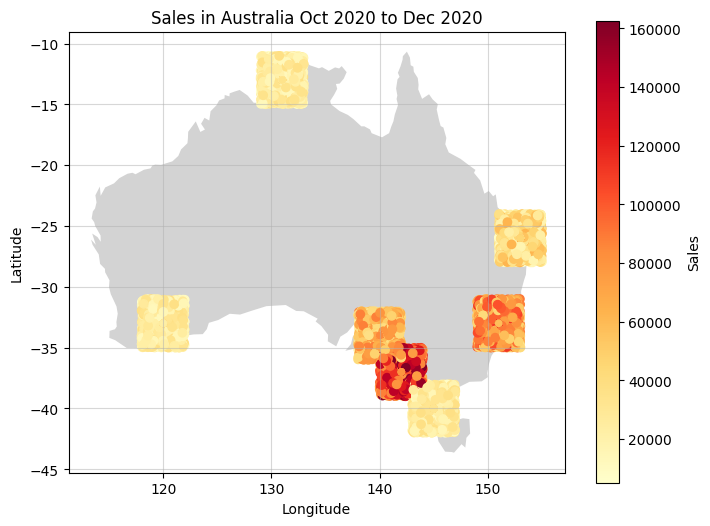

In [30]:
# Convert Latitude and Longitude columns to integers to plot them
sales['Latitude'] = sales['Latitude'].astype(float).astype(int)
sales['Longitude'] = sales['Longitude'].astype(float).astype(int)

# initialize an axis
fig, ax = plt.subplots(figsize=(8,6))

# plot map on axis
countries = gpd.read_file(
     gpd.datasets.get_path("naturalearth_lowres"))
countries[countries["name"] == "Australia"].plot(color="lightgrey", ax=ax)

# determine dates for plot's title
first_month = sales["Date"].min().strftime("%b %Y")
last_month = sales["Date"].max().strftime("%b %Y")

#sales['MarkerSize'] = sales['Sales'] * 0.1 ,,,,, s=sales['MarkerSize'],

# spread points for coordinates with the same location
spreated_coordinates = sales.copy()
point_spread_num = 2
spreated_coordinates['Latitude'] += np.random.uniform(-point_spread_num, point_spread_num, len(spreated_coordinates))
spreated_coordinates['Longitude'] += np.random.uniform(-point_spread_num, point_spread_num, len(spreated_coordinates))

# plot points with jittering
ax.scatter(spreated_coordinates['Longitude'], spreated_coordinates['Latitude'], c=spreated_coordinates['Sales'], cmap='YlOrRd')


# plot points
sales.plot(x="Longitude", y="Latitude", kind="scatter",
        c="Sales", colormap="YlOrRd",
        title=f"Sales in Australia {first_month} to {last_month}",
        ax=ax)
# add grid
ax.grid(True, alpha=0.5)
plt.show()


In [33]:
# Convert Latitude and Longitude columns to integers to plot them
sales['Latitude'] = sales['Latitude'].astype(float).astype(int)
sales['Longitude'] = sales['Longitude'].astype(float).astype(int)

#folium map centered in australia
m = folium.Map(location=[-25, 135], zoom_start=4)

folium.GeoJson(countries[countries["name"] == "Australia"].geometry).add_to(m)

# Create a MarkerCluster to group the scatter plot markers:
marker_cluster = MarkerCluster().add_to(m)

#Iterate over the sales data to add scatter plot markers to the MarkerCluster:
for idx, row in sales.iterrows():
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=3,
        color='red',
        fill=True,
        fill_color='red',
        fill_opacity=0.6,
        popup=f"Sales: {row['Sales']}"
    ).add_to(marker_cluster)

m